In [1]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

from psutil import virtual_memory
ram_gb = virtual_memory().total / 1e9
print('Your runtime has {:.1f} gigabytes of available RAM\n'.format(ram_gb))

if ram_gb < 20:
  print('Not using a high-RAM runtime')
else:
  print('You are using a high-RAM runtime!')

Wed Aug 17 09:20:34 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   33C    P0    27W / 250W |      0MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

## Install TensorTrade

In [2]:
!python3 -m pip install git+https://github.com/tensortrade-org/tensortrade.git
!pip install ccxt
!pip install stable-baselines3
!pip install ta
!pip install pyyaml==5.4.1

# Load the TensorBoard notebook extension
%load_ext tensorboard

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/tensortrade-org/tensortrade.git to /tmp/pip-req-build-5ynl3u1h
  Running command git clone -q https://github.com/tensortrade-org/tensortrade.git /tmp/pip-req-build-5ynl3u1h
     |████████████████████████████████| 596 kB 5.1 MB/s 
     |████████████████████████████████| 49 kB 7.2 MB/s 
     |████████████████████████████████| 793 kB 84.5 MB/s 
     |████████████████████████████████| 1.6 MB 89.6 MB/s 
  Created wheel for tensortrade: filename=tensortrade-1.0.4.dev1-py3-none-any.whl size=136256 sha256=8a2381affedf747ed8b576cca45c8e3291e2504a797933b583bda99e0eaaaa90
  Stored in directory: /tmp/pip-ephem-wheel-cache-u1appx9h/wheels/f8/96/4d/142e37e09469abec8017a451809b175d5f64d0ce81cbe8d8ec
Successfully built tensortrade
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.1

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 177 kB 5.1 MB/s 
     |████████████████████████████████| 1.5 MB 75.0 MB/s 
  Created wheel for gym: filename=gym-0.21.0-py3-none-any.whl size=1616797 sha256=fa80af389a9b02be6c3da794127d608db6966d6729799cd4df9f05ef6a5036cc
  Stored in directory: /root/.cache/pip/wheels/76/ee/9c/36bfe3e079df99acf5ae57f4e3464ff2771b34447d6d2f2148
Successfully built gym
  Attempting uninstall: gym
    Found existing installation: gym 0.17.3
    Uninstalling gym-0.17.3:
      Successfully uninstalled gym-0.17.3
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Created wheel for ta: filename=ta-0.10.1-py3-none-any.whl size=28971 sha256=efd84cda0c6818dbad725f2ea436f0236831b7297de0c14e425c77895046d469
  Stored in directory: /root/.cache/pip/wheels/bc/2a/c2/a56e77d07edc16a1fa7fb012667e55cb0643cfa65996bddecc
Successfully buil

In [3]:
!pip install quantstats

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 41 kB 305 kB/s 
     |████████████████████████████████| 62 kB 1.5 MB/s 
  Attempting uninstall: requests
    Found existing installation: requests 2.23.0
    Uninstalling requests-2.23.0:
      Successfully uninstalled requests-2.23.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires ipython~=7.9.0, but you have ipython 7.34.0 which is incompatible.


## Setup Data Fetching

In [4]:
import pandas as pd
import tensortrade.env.default as default
import ta

import ccxt
from datetime import datetime, timedelta, time
from sklearn.preprocessing import RobustScaler, StandardScaler, PowerTransformer, MinMaxScaler

from tensortrade.data.cdd import CryptoDataDownload
from tensortrade.feed.core import Stream, DataFeed
from tensortrade.oms.exchanges import Exchange
from tensortrade.oms.services.execution.simulated import execute_order
from tensortrade.oms.instruments import USDT, BTC, ETH
from tensortrade.oms.wallets import Wallet, Portfolio
from tensortrade.agents import DQNAgent

from stable_baselines3 import A2C, PPO, DQN

%matplotlib inline

In [5]:
from tensortrade.data.cdd import CryptoDataDownload

import numpy as np
import pandas as pd
pd.options.mode.use_inf_as_na = True

def prepare_data(df):
    df['volume'] = np.int64(df['volume'])
    df['date'] = pd.to_datetime(df['date'])
    df.sort_values(by='date', ascending=True, inplace=True)
    df.reset_index(drop=True, inplace=True)
    df['date'] = df['date'].dt.strftime('%Y-%m-%d')
    return df

def fetch_data():
    cdd = CryptoDataDownload()
    bitfinex_data = cdd.fetch("Bitfinex", "USD", "BTC", "d")
    bitfinex_data = bitfinex_data[['date', 'open', 'high', 'low', 'close', 'volume']]
    bitfinex_data = prepare_data(bitfinex_data)
    print(bitfinex_data)
    return bitfinex_data

def load_csv(filename):
    df = pd.read_csv('data/' + filename, skiprows=1)
    df.drop(columns=['symbol', 'volume_btc'], inplace=True)

    # Fix timestamp from "2019-10-17 09-AM" to "2019-10-17 09-00-00 AM"
    df['date'] = df['date'].str[:14] + '00-00 ' + df['date'].str[-2:]

    return prepare_data(df)


fetch_data()


            date      open      high       low         close     volume
0     2015-02-09    224.22    225.00    215.40    220.610000    6493501
1     2015-02-10    220.61    223.88    214.00    220.960000    6402350
2     2015-02-11    220.96    224.40    218.10    219.190000    4268986
3     2015-02-12    219.19    223.20    217.87    222.600000    2468883
4     2015-02-13    222.39    241.76    221.46    236.000000    6806972
...          ...       ...       ...       ...           ...        ...
2741  2022-08-12  23932.00  24470.00  23600.00  24401.000000   86818921
2742  2022-08-13  24399.00  24900.00  24284.00  24425.000000   98880147
2743  2022-08-14  24435.00  25068.00  24143.00  24300.000000   66677810
2744  2022-08-15  24303.00  25205.00  23758.00  24094.000000  215251202
2745  2022-08-16  24091.00  24147.00  23962.00  24098.423965    1645119

[2746 rows x 6 columns]


,date,open,high,low,close,volume
0,2015-02-09,224.22,225.00,215.40,220.610000,6493501
1,2015-02-10,220.61,223.88,214.00,220.960000,6402350
2,2015-02-11,220.96,224.40,218.10,219.190000,4268986
3,2015-02-12,219.19,223.20,217.87,222.600000,2468883
4,2015-02-13,222.39,241.76,221.46,236.000000,6806972
...,...,...,...,...,...,...
2741,2022-08-12,23932.00,24470.00,23600.00,24401.000000,86818921
2742,2022-08-13,24399.00,24900.00,24284.00,24425.000000,98880147
2743,2022-08-14,24435.00,25068.00,24143.00,24300.000000,66677810
2744,2022-08-15,24303.00,25205.00,23758.00,24094.000000,215251202


In [6]:
import ta
import pandas as pd

#BTC/USD data, volume = volume of BTC
from ta import add_all_ta_features
data = fetch_data()

start_date = '2015-02-09'
end_date = '2022-07-16'
after_start_date = data["date"] >= start_date
before_end_date = data["date"] <= end_date
between_two_dates = after_start_date & before_end_date
# Using pandas.DataFrame.loc to Filter Rows by Dates
data = data.loc[between_two_dates]

features = data.copy()
# features = add_all_ta_features(
#     features, open="open", high="high", low="low", close="close", volume="volume", fillna=True)

data = data[['open','high','low','close','volume','date']]


            date      open      high       low         close     volume
0     2015-02-09    224.22    225.00    215.40    220.610000    6493501
1     2015-02-10    220.61    223.88    214.00    220.960000    6402350
2     2015-02-11    220.96    224.40    218.10    219.190000    4268986
3     2015-02-12    219.19    223.20    217.87    222.600000    2468883
4     2015-02-13    222.39    241.76    221.46    236.000000    6806972
...          ...       ...       ...       ...           ...        ...
2741  2022-08-12  23932.00  24470.00  23600.00  24401.000000   86818921
2742  2022-08-13  24399.00  24900.00  24284.00  24425.000000   98880147
2743  2022-08-14  24435.00  25068.00  24143.00  24300.000000   66677810
2744  2022-08-15  24303.00  25205.00  23758.00  24094.000000  215251202
2745  2022-08-16  24091.00  24147.00  23962.00  24098.423965    1645119

[2746 rows x 6 columns]


In [7]:
from ta import add_volume_ta, add_volatility_ta, add_trend_ta, add_momentum_ta
#Add trend indicators

features = add_momentum_ta(features, high="high", low="low", close="close", volume="volume", fillna=True)

In [8]:
from sklearn.compose import make_column_transformer
#Function to Standardising data and excluding anomynous
def prepare_input(X):

  names = X.copy()

  volume = X.select_dtypes(include=['int64']).columns

  prices_columns = X.select_dtypes(include=['float64']).columns

  column_trans = make_column_transformer(

      (MinMaxScaler(feature_range=(-1,1)), prices_columns),
      (MinMaxScaler(feature_range=(0,1)), volume),

      remainder='passthrough'

      )

  X = column_trans.fit_transform(X)

  df = pd.DataFrame(X, columns= column_trans.get_feature_names_out())

  df = df.rename({'remainder__date': 'date'}, axis='columns') #,'minmaxscaler-2__volume':'volume'

  cols=[i for i in df.columns if i not in ["date"]]
  for col in cols:
      df[col]=pd.to_numeric(df[col])

  
  return df

In [9]:
features = prepare_input(features)

train/test split: training 10:1 testing 

In [10]:



first_cols = ['minmaxscaler-2__volume','date']
last_cols = [col for col in features.columns if col not in first_cols]

view = features[first_cols+last_cols]


train_size = 10
split = int(len(data)/(1/train_size+1))
train_data = data.iloc[:split,:].copy()
test_data = data.iloc[split:,:].copy()
train_view = view.iloc[:split,:].copy()
test_view = view.iloc[split:,:].copy()
print(len(train_data))
print(len(test_data))

2468
247


In [11]:
import plotly.express as px
fig = px.line(features, x='date',y= features.columns) 
fig.show()

Output hidden; open in https://colab.research.google.com to view.

In [12]:
train_data

,open,high,low,close,volume,date
0,224.220000,225.00,215.40,220.61,6493501,2015-02-09
1,220.610000,223.88,214.00,220.96,6402350,2015-02-10
2,220.960000,224.40,218.10,219.19,4268986,2015-02-11
3,219.190000,223.20,217.87,222.60,2468883,2015-02-12
4,222.390000,241.76,221.46,236.00,6806972,2015-02-13
...,...,...,...,...,...,...
2463,61495.043887,63279.00,61400.00,63263.00,204629120,2021-11-07
2464,63277.000000,67665.00,63277.00,67526.00,606485965,2021-11-08
2465,67526.000000,68444.00,66326.00,66938.00,432722748,2021-11-09
2466,66937.190226,68958.00,62866.00,64871.00,793693585,2021-11-10


In [13]:
test_data

,open,high,low,close,volume,date
2468,64785.000000,65421.000000,62255.000000,64134.000000,328314220,2021-11-12
2469,64134.000000,64988.986282,63405.000000,64398.000000,120309117,2021-11-13
2470,64395.000000,65474.000000,63564.000000,65474.000000,143689598,2021-11-14
2471,65474.000000,66343.875554,63351.000000,63561.000000,335054048,2021-11-15
2472,63560.000000,63561.992029,58625.687342,60068.000000,784932415,2021-11-16
...,...,...,...,...,...,...
2710,19945.000000,20038.233653,19216.566333,19310.533476,130887320,2022-07-12
2711,19308.000000,20347.000000,18912.596920,20246.000000,242951062,2022-07-13
2712,20232.000000,21026.000000,19625.000000,20582.000000,124704257,2022-07-14
2713,20580.881622,21195.000000,20373.000000,20820.000000,74761939,2022-07-15


## Setup Trading Environment

In [14]:
import numpy as np
from gym.spaces import Box, Space
from tensortrade.env.default.observers import _create_internal_streams, ObservationHistory
from tensortrade.env.generic import Observer
from tensortrade.feed import DataFeed, Stream
from tensortrade.oms.wallets import Portfolio

Action Scheme

In [15]:
class BSH(default.actions.TensorTradeActionScheme):
    """A simple discrete action scheme where the only options are to buy, sell,
    or hold.
    Parameters
    ----------
    cash : `Wallet`
        The wallet to hold funds in the base intrument.
    asset : `Wallet`
        The wallet to hold funds in the quote instrument.
    """

    registered_name = "bsh"

    def __init__(self, cash: 'Wallet', asset: 'Wallet'):
        super().__init__()
        self.cash = cash
        self.asset = asset

        self.listeners = []
        self.action = 0

    @property
    def action_space(self):
        return Discrete(2)

    def attach(self, listener):
        self.listeners += [listener]
        return self

    def get_orders(self, action: int, portfolio: 'Portfolio') -> 'Order':
        order = None

        if abs(action - self.action) > 0:
            src = self.cash if self.action == 0 else self.asset
            tgt = self.asset if self.action == 0 else self.cash

            if src.balance == 0:  # We need to check, regardless of the proposed order, if we have balance in 'src'
                return []  # Otherwise just return an empty order list

            order = proportion_order(portfolio, src, tgt, 1.0)
            self.action = action

        for listener in self.listeners:
            listener.on_action(action)

        return [order]

    def reset(self):
        super().reset()
        self.action = 0

Reward scheme

In [16]:
import numpy as np
class SimpleProfit(default.rewards.TensorTradeRewardScheme):
    """A simple reward scheme that rewards the agent for incremental increases
    in net worth.

    Parameters
    ----------
    window_size : int
        The size of the look back window for computing the reward.

    Attributes
    ----------
    window_size : int
        The size of the look back window for computing the reward.
    """

    def __init__(self, window_size: int = 14):
        self._window_size = self.default('window_size', window_size)

    def get_reward(self, portfolio: 'Portfolio') -> float:
        """Rewards the agent for incremental increases in net worth over a
        sliding window.

        Parameters
        ----------
        portfolio : `Portfolio`
            The portfolio being used by the environment.

        Returns
        -------
        float
            The cumulative percentage change in net worth over the previous
            `window_size` time steps.
        """
        net_worths = [nw['net_worth'] for nw in portfolio.performance.values()]
        returns = [(b - a)/a for a, b in zip(net_worths[::1], net_worths[1::1])]
        #if len(net_worths) > 4:
        #  print(net_worths[-3:])
        #  print(returns[-2:])
        #returns = np.array([x + 1 for x in returns[-self._window_size:]]).cumprod() - 1
        return 0 if len(returns) < 1 else returns[-1]


Compile data to Environment

In [17]:
from typing import Union

from tensortrade.env.default import observers
from tensortrade.env.default import stoppers
from tensortrade.env.default import informers
from tensortrade.env.default import renderers

from tensortrade.env.generic import TradingEnv
from tensortrade.env.generic.components.renderer import AggregateRenderer
from tensortrade.feed.core import DataFeed
from tensortrade.oms.wallets import Portfolio
from tensortrade.oms.exchanges import Exchange, ExchangeOptions

def create_env(data: pd.DataFrame, view: pd.DataFrame, is_train_data: bool):
  features = []
  for c in data.columns[:]:
      if data[c].name == 'date':
        if is_train_data and False:
          s = Stream.source(list(data[c]), dtype="DateTime").rename('timestamp')
        else:
          continue
      else:
        s = Stream.source(list(data[c]), dtype="float").rename(data[c].name)
      features += [s]


  feed = DataFeed(features)
  feed.compile()



# TODO: adjust according to your commission percentage, if present
  commission = 0.005
  slippage = ExchangeOptions(commission=commission)

  price = Stream.source(list(view["close"]), dtype="float").rename("USDT-BTC")
  binance = Exchange("binance", service=execute_order,
                      options=slippage)(
      price
  )

  cash = Wallet(binance, 10000 * USDT)
  asset = Wallet(binance, 0 * BTC)

  portfolio = Portfolio(USDT, [
      cash,
      asset
  ])


  renderer_feed = DataFeed([
      Stream.source(list(view["date"])).rename("date"),
      Stream.source(list(view["open"]), dtype="float").rename("open"),
      Stream.source(list(view["high"]), dtype="float").rename("high"),
      Stream.source(list(view["low"]), dtype="float").rename("low"),
      Stream.source(list(view["close"]), dtype="float").rename("close"), 
      Stream.source(list(view["volume"]), dtype="float").rename("volume") 
  ])


  env = default.create(
      portfolio=portfolio,
      action_scheme=default.actions.BSH(cash, asset),
      #reward_scheme=default.rewards.PBR(price),
      reward_scheme=SimpleProfit(window_size=10),
      #reward_scheme='risk-adjusted',
      feed=feed,
      renderer_feed=renderer_feed,
      renderer=default.renderers.PlotlyTradingChart(),
      window_size=40,
      stopper=default.stoppers.MaxLossStopper(0.75),
      min_periods= None
  ) if is_train_data else default.create(
      portfolio=portfolio,
      action_scheme=default.actions.BSH(cash, asset),
      #reward_scheme=default.rewards.PBR(price),
      reward_scheme=SimpleProfit(window_size=10),
      #reward_scheme='risk-adjusted',
      feed=feed,
      renderer_feed=renderer_feed,
      renderer=default.renderers.PlotlyTradingChart(),
      window_size=40,
      stopper=default.stoppers.MaxLossStopper(0.75),
      min_periods=None
  )

  return env

In [18]:
from google.colab import output
output.enable_custom_widget_manager()
# Load the TensorBoard notebook extension
%load_ext tensorboard

%tensorboard --logdir logs

Output hidden; open in https://colab.research.google.com to view.

## Setup and Train A2C Agent

**Training agents train loop**

In [19]:
episode = 30

The Agents see:


Defined repeat_agent_training = 3
Full data contains: 2468 steps.
DQN model:
repeat_agent_training: 1 | ran steps = 954 | No. of trade = 385 | % Return = -75.5
repeat_agent_training: 2 | ran steps = 956 | No. of trade = 395 | % Return = -75.4
repeat_agent_training: 3 | ran steps = 1092 | No. of trade = 453 | % Return = -77.6
PPO model:
repeat_agent_training: 1 | ran steps = 2468 | No. of trade = 569 | % Return = 12528.8
repeat_agent_training: 2 | ran steps = 2468 | No. of trade = 573 | % Return = 4664.4
repeat_agent_training: 3 | ran steps = 2468 | No. of trade = 607 | % Return = 1251.7
A2C model:
repeat_agent_training: 1 | ran steps = 2468 | No. of trade = 13 | % Return = 40029.5
repeat_agent_training: 2 | ran steps = 2468 | No. of trade = 13 | % Return = 34291.5
repeat_agent_training: 3 | ran steps = 2468 | No. of trade = 9 | % Return = 40420.8
Training compelted


<function matplotlib.pyplot.show(*args, **kw)>

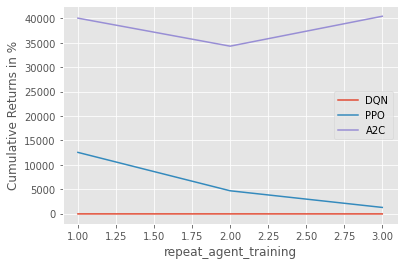

In [20]:
print('The Agents see:')
import plotly.express as px
fig = px.line(train_view, x='date',y= train_view.columns) 
fig.show()


#Setting all training environments for all agents
train_env = create_env(train_data,train_data , False)

train_DQN = create_env(train_data,train_data , False)
train_PPO = create_env(train_data,train_data , False)
train_A2C = create_env(train_data,train_data , False)
list_train_envs = [train_DQN, train_PPO, train_A2C]

circuit = [DQN, PPO, A2C]
name_agents = ['DQN','PPO','A2C']

#Define repeat_agent_training to calculate a mean as agent is stochastic**
repeat_agent_training = 3

#reminder of steps in environment
print('Defined repeat_agent_training =',repeat_agent_training)
print('Full data contains:',len(train_data),'steps.')



#Main training loop
networth_records = []
for DRL_agents,training_environments,name in zip(circuit,list_train_envs,name_agents):
  model = DRL_agents
  print(name, 'model:')

  policy = 'MlpPolicy'

  DRL_agents = model(policy, train_env, tensorboard_log="./logs")
  DRL_agents.learn(total_timesteps=len(train_data)*episode)

  for repeat_ep in range(1,repeat_agent_training+1):
    obs = training_environments.reset()
    done = False
    while not done:
      action, _states = DRL_agents.predict(obs)
      obs, rewards, done, info = training_environments.step(action)
    
    performance = pd.DataFrame.from_dict(training_environments.action_scheme.portfolio.performance, orient='index')
    net_worth = performance['net_worth'].iloc[:]
    net_worth = net_worth.values[-1]


    Number_steps = len(training_environments.action_scheme.portfolio.performance)
    Number_trade = len(training_environments.action_scheme.broker.trades)

    # networth_records.append([name,ep,net_worth])
    # trade_records.append([Number_steps,Number_steps,])    

    print('repeat_agent_training:',repeat_ep,'| ran steps =',Number_steps,'| No. of trade =',Number_trade, '| % Return =',round(((net_worth-10000)/10000)*100,1))

    networth_records.append([name,repeat_ep,net_worth,Number_steps,Number_trade])



networth_records = pd.DataFrame(networth_records)
networth_records['returns'] = ((networth_records[[2]]-10000)/10000)*100
networth_records.rename(columns = {0: 'agents',1:'repeat_agent_training', 2:'networth', 3:'step_ran', 4:'num_trade'}, inplace = True)
K_networth_records = networth_records

DQN_train_records = K_networth_records[K_networth_records['agents']=='DQN']
PPO_train_records = K_networth_records[K_networth_records['agents']=='PPO']
A2C_train_records = K_networth_records[K_networth_records['agents']=='A2C']

#Reminder
print('Training compelted')

import matplotlib.pyplot as plt
#plot the change in return for all repeat_agent_trainings
plt.plot(DQN_train_records['repeat_agent_training'],DQN_train_records['returns'], label = "DQN")
plt.plot(PPO_train_records['repeat_agent_training'],PPO_train_records['returns'], label = "PPO")
plt.plot(A2C_train_records['repeat_agent_training'],A2C_train_records['returns'], label = "A2C")
plt.ylabel('Cumulative Returns in %')
plt.xlabel('repeat_agent_training')

plt.legend()
plt.show


DQN | mean number of step 1000.6666666666666
    | mean number of trade 411.0
    | mean number of returns -76.185414012
PPO | mean number of step 2468.0
    | mean number of trade 583.0
    | mean number of returns 6148.275864161001
A2C | mean number of step 2468.0
A2C | mean number of trade 11.666666666666666
A2C | mean number of returns 38247.2810738732


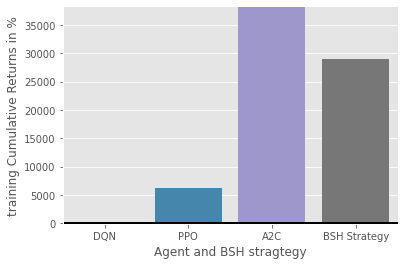

<Figure size 432x288 with 0 Axes>

In [21]:
print('DQN | mean number of step',DQN_train_records.step_ran.mean())
print('    | mean number of trade',DQN_train_records.num_trade.mean())
print('    | mean number of returns',DQN_train_records.returns.mean())

print('=================================================')


print('PPO | mean number of step',PPO_train_records.step_ran.mean())
print('    | mean number of trade',PPO_train_records.num_trade.mean())
print('    | mean number of returns',PPO_train_records.returns.mean())
print('=================================================')

print('A2C | mean number of step',A2C_train_records.step_ran.mean())
print('A2C | mean number of trade',A2C_train_records.num_trade.mean())
print('A2C | mean number of returns',A2C_train_records.returns.mean())

BSH_train = pd.DataFrame([['BSH Strategy',28897]], columns=['agents','returns'])
train_returns = pd.DataFrame([['DQN',DQN_train_records.returns.mean()], ['PPO',PPO_train_records.returns.mean()],['A2C',A2C_train_records.returns.mean()]], columns=['agents','returns'])
compare_BSH_train = pd.concat([train_returns, BSH_train])

import seaborn as sns
plt.ylim(min(compare_BSH_train.returns), max(compare_BSH_train.returns))
train = sns.barplot(y='returns',x='agents',data=compare_BSH_train)
train.set(xlabel='Agent and BSH stragtegy', ylabel='training Cumulative Returns in %', ylim = (min(compare_BSH_train.returns), max(compare_BSH_train.returns) ))
train.axhline(y=0.0, color='black', linestyle='-', linewidth=2)
plt.show()

plt.savefig('base_train_results')

[Performance Metrics]



                           Strategy
-------------------------  ----------
Start Period               2015-02-09
End Period                 2018-02-03
Risk-Free Rate             0.0%
Time in Market             58.0%

Cumulative Return          -77.64%
CAGR﹪                     -39.44%

Sharpe                     -0.75
Prob. Sharpe Ratio         6.11%
Smart Sharpe               -0.74
Sortino                    -1.06
Smart Sortino              -1.04
Sortino/√2                 -0.75
Smart Sortino/√2           -0.73
Omega                      0.8

Max Drawdown               -78.8%
Longest DD Days            1086
Volatility (ann.)          36.87%
Calmar                     -0.5
Skew                       0.3
Kurtosis                   22.21

Expected Daily %           -0.14%
Expected Monthly %         -3.97%
Expected Yearly %          -31.23%
Kelly Criterion            -7.49%
Risk of Ruin               0.0%
Daily Value-at-Risk        -3.93%
Expected Shortfall (cVaR)  -3.93%

Max Consecutive 

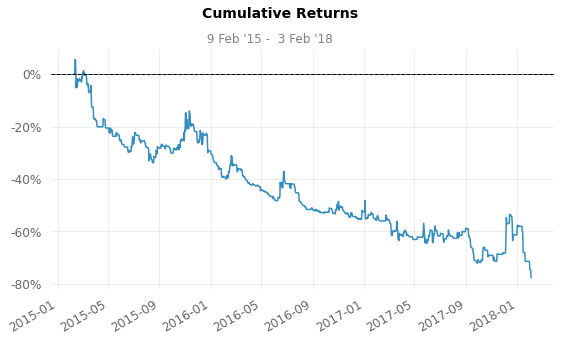

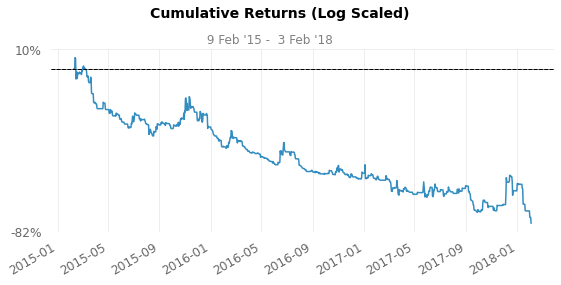

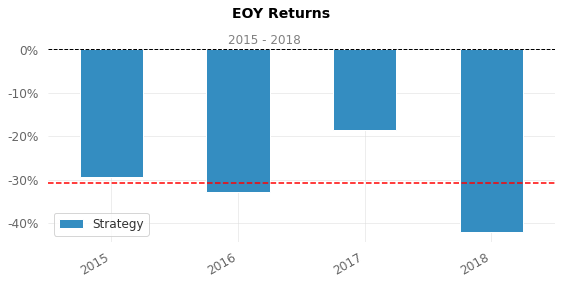

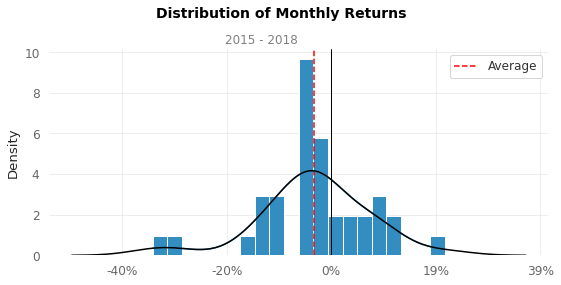

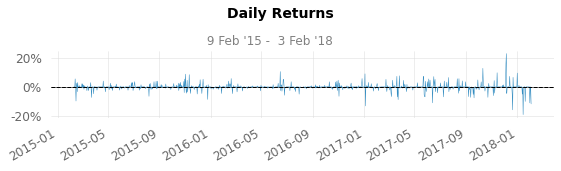

...

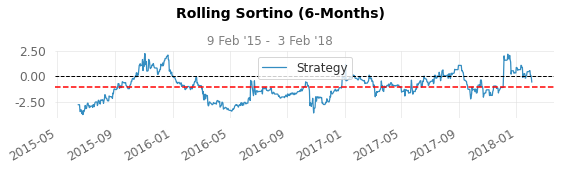

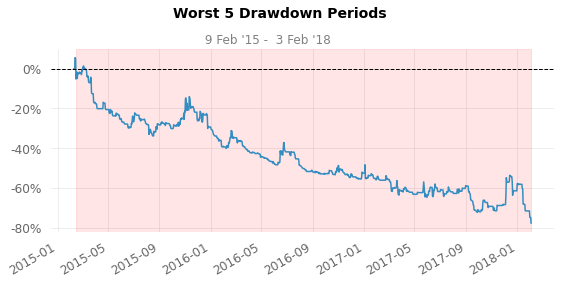

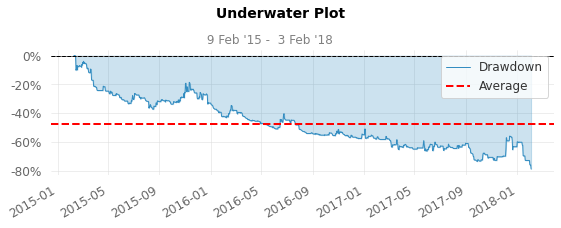

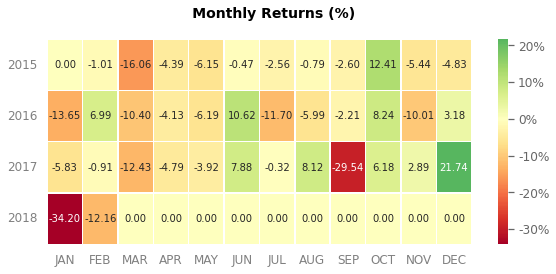

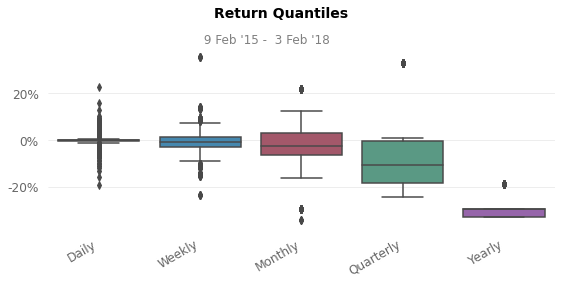

In [22]:
import quantstats as qs
qs.extend_pandas()


def print_quantstats_full_report(env, data, output='dqn_quantstats'):
    performance = pd.DataFrame.from_dict(env.action_scheme.portfolio.performance, orient='index')
    net_worth = performance['net_worth'].iloc[:]
    returns = net_worth.pct_change().iloc[1:]
    print('=================================')
    # WARNING! The dates are fake and default parameters are used!
    returns.index = pd.date_range(start=data['date'].iloc[0], freq='1D', periods=returns.size)

    qs.reports.full(returns)
    #qs.reports.html(returns, output='output + '.html')

print_quantstats_full_report(train_DQN, train_data)

[Performance Metrics]

                           Strategy
-------------------------  ----------
Start Period               2015-02-09
End Period                 2021-11-10
Risk-Free Rate             0.0%
Time in Market             97.0%

Cumulative Return          1,251.67%
CAGR﹪                     47.02%

Sharpe                     0.76
Prob. Sharpe Ratio         99.06%
Smart Sharpe               0.71
Sortino                    1.12
Smart Sortino              1.05
Sortino/√2                 0.79
Smart Sortino/√2           0.75
Omega                      1.16

Max Drawdown               -81.96%
Longest DD Days            1149
Volatility (ann.)          56.8%
Calmar                     0.57
Skew                       -0.2
Kurtosis                   10.05

Expected Daily %           0.11%
Expected Monthly %         3.23%
Expected Yearly %          45.06%
Kelly Criterion            6.51%
Risk of Ruin               0.0%
Daily Value-at-Risk        -5.72%
Expected Shortfall (cVaR)  -5.72%


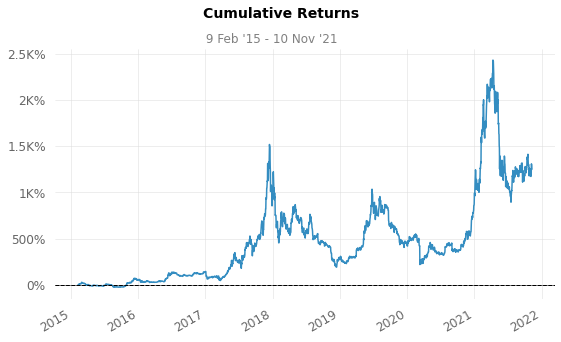

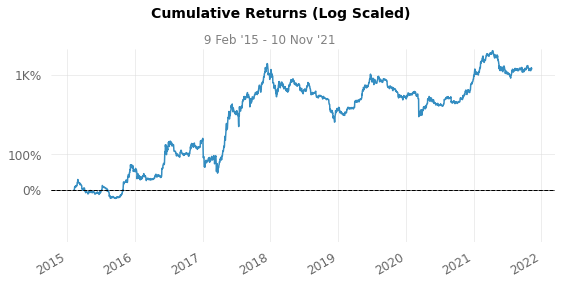

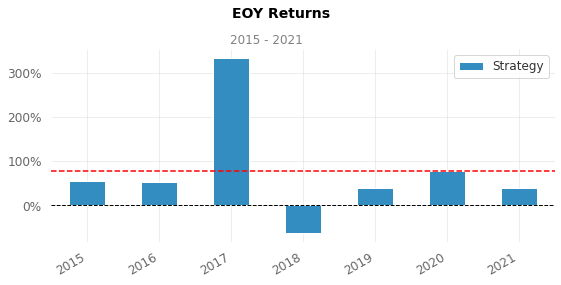

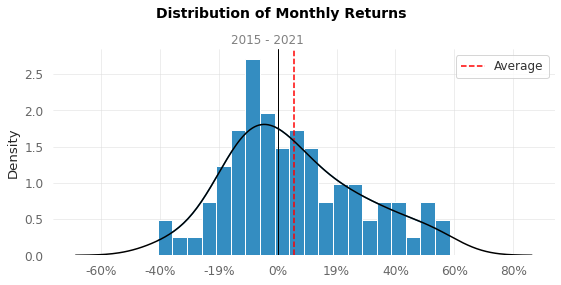

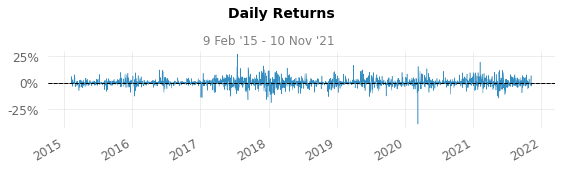

...

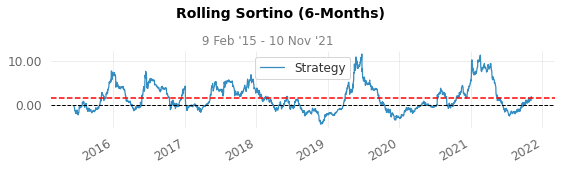

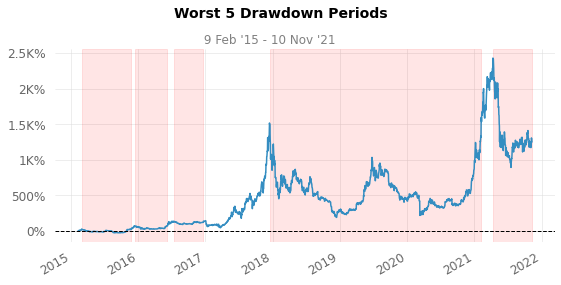

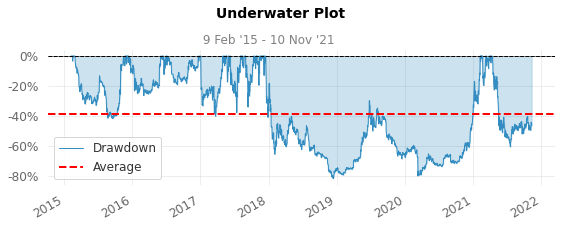

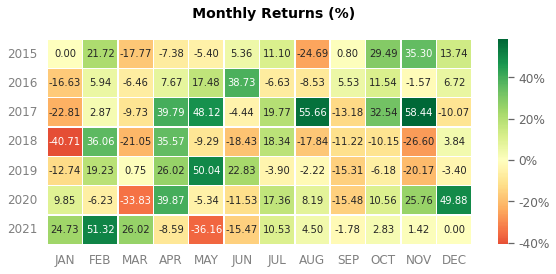

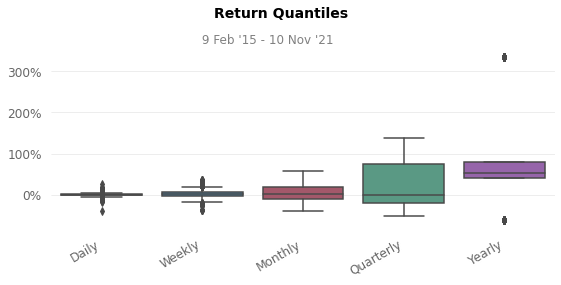

In [23]:
print_quantstats_full_report(train_PPO, train_data)

[Performance Metrics]

                           Strategy
-------------------------  ----------
Start Period               2015-02-09
End Period                 2021-11-10
Risk-Free Rate             0.0%
Time in Market             100.0%

Cumulative Return          40,420.82%
CAGR﹪                     143.2%

Sharpe                     1.3
Prob. Sharpe Ratio         100.0%
Smart Sharpe               1.23
Sortino                    1.96
Smart Sortino              1.85
Sortino/√2                 1.39
Smart Sortino/√2           1.31
Omega                      1.28

Max Drawdown               -82.92%
Longest DD Days            1079
Volatility (ann.)          61.89%
Calmar                     1.73
Skew                       -0.12
Kurtosis                   7.68

Expected Daily %           0.24%
Expected Monthly %         7.6%
Expected Yearly %          135.79%
Kelly Criterion            11.95%
Risk of Ruin               0.0%
Daily Value-at-Risk        -6.09%
Expected Shortfall (cVaR)  -6.0

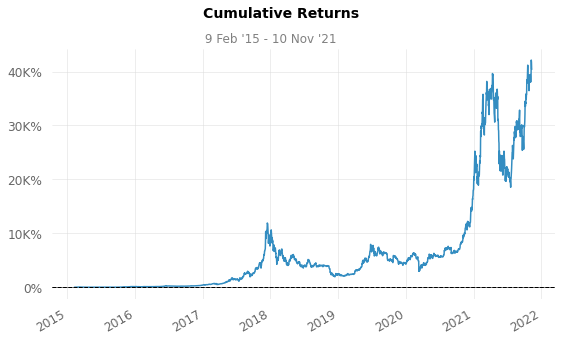

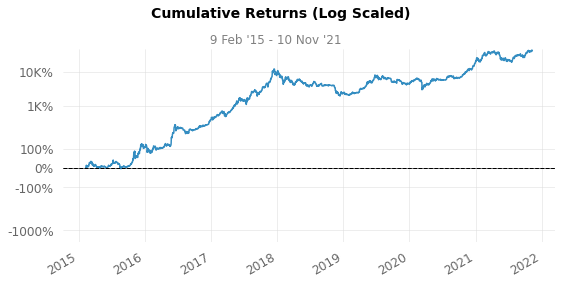

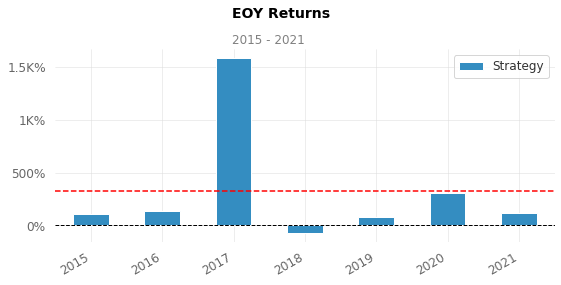

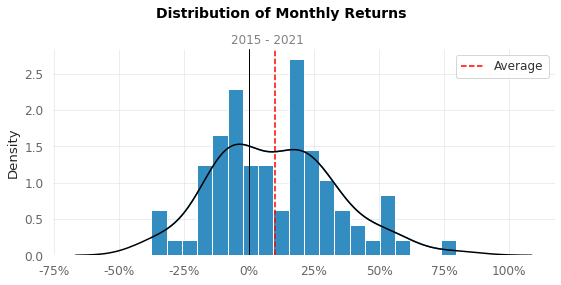

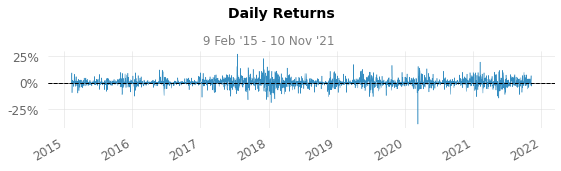

...

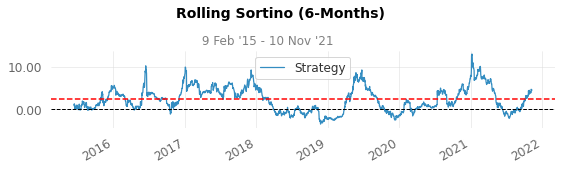

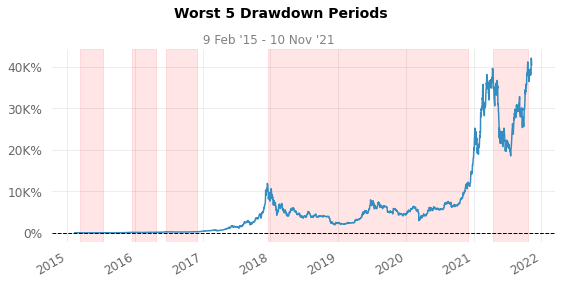

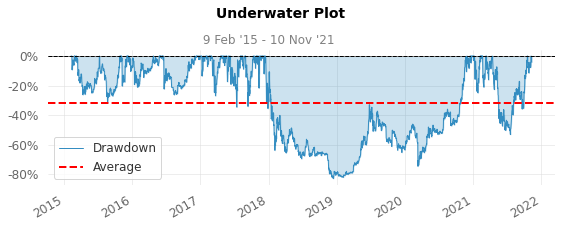

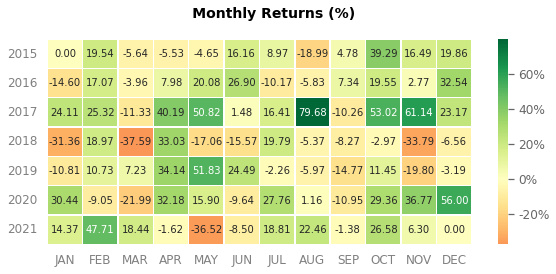

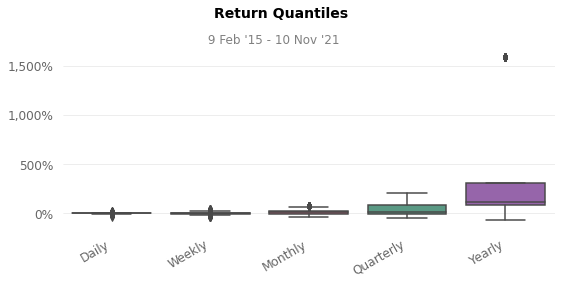

In [24]:
print_quantstats_full_report(train_A2C, train_data)

**Testing agents**

The Agents see:


Full data contains: 247 steps.
DQN | ran steps = 247 | No. of trade = 9 | % Return = -66.0
PPO | ran steps = 223 | No. of trade = 97 | % Return = -75.1
A2C | ran steps = 247 | No. of trade = 82 | % Return = -52.6
Testing completed


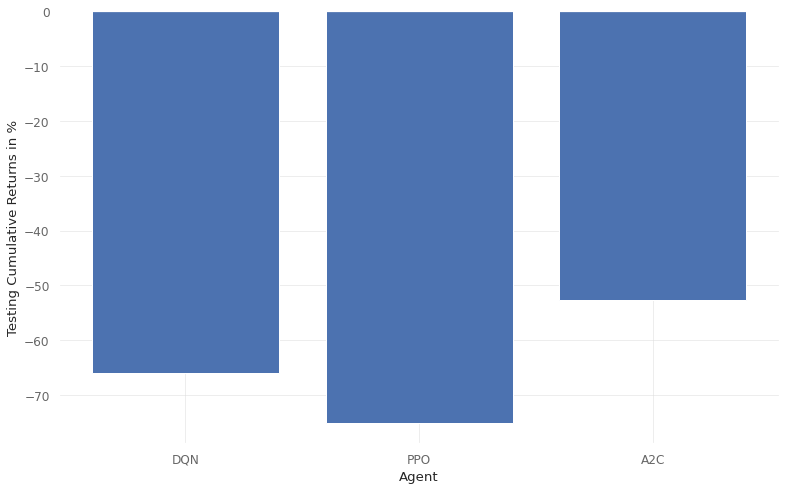

In [25]:
#Gives comparison
print('The Agents see:')
fig = px.line(test_view, x='date',y= test_view.columns) 
fig.show()

#Setting all testing environments for all agents
test_env = create_env(test_view,test_data , False)

test_DQN = create_env(test_view,test_data, False)
test_PPO = create_env(test_view,test_data, False)
test_A2C = create_env(test_view,test_data, False)
list_test_envs = [test_DQN, test_PPO, test_A2C]

circuit = [DQN, PPO, A2C]
name_agents = ['DQN','PPO','A2C']

#reminder of steps in environment
print('Full data contains:',len(test_data),'steps.')

#Main training loop
test_records = []

for DRL_agents,testing_environments,name in zip(circuit,list_test_envs,name_agents):
  model = DRL_agents

  policy = 'MlpPolicy'

  DRL_agents = model(policy, testing_environments, tensorboard_log="./logs")
  DRL_agents.learn(total_timesteps=len(test_data))

  obs = testing_environments.reset()
  done = False
  while not done:
    action, _states = DRL_agents.predict(obs)
    obs, rewards, done, info = testing_environments.step(action)
  
  test_performance = pd.DataFrame.from_dict(testing_environments.action_scheme.portfolio.performance, orient='index')
  test_net_worth = test_performance['net_worth'].iloc[:]
  test_net_worth = test_net_worth.values[-1]


  test_Number_steps = len(testing_environments.action_scheme.portfolio.performance)
  test_Number_trade = len(testing_environments.action_scheme.broker.trades)

  # networth_records.append([name,ep,net_worth])
  # trade_records.append([Number_steps,Number_steps,])    

  print(name,'| ran steps =',test_Number_steps,'| No. of trade =',test_Number_trade, '| % Return =',round(((test_net_worth-10000)/10000)*100,1))

  test_records.append([name,repeat_ep,test_net_worth,test_Number_steps,test_Number_trade])
  #testing_environments.render()


test_records = pd.DataFrame(test_records)
test_records['returns'] = ((test_records[[2]]-10000)/10000)*100
test_records.rename(columns = {0: 'agents',1:'repeat_agent_training', 2:'networth', 3:'step_ran', 4:'num_trade'}, inplace = True)
test_K_networth_records = test_records

test_DQN_records = test_K_networth_records[test_K_networth_records['agents']=='DQN']
test_PPO_records = test_K_networth_records[test_K_networth_records['agents']=='PPO']
test_A2C_records = test_K_networth_records[test_K_networth_records['agents']=='A2C']

print('Testing completed')

import matplotlib.pyplot as plt
#plot the change in return for all repeat_agent_trainings
fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
ax.bar(test_K_networth_records['agents'],test_K_networth_records['returns'])
plt.ylabel('Testing Cumulative Returns in %')
plt.xlabel('Agent')
plt.show()


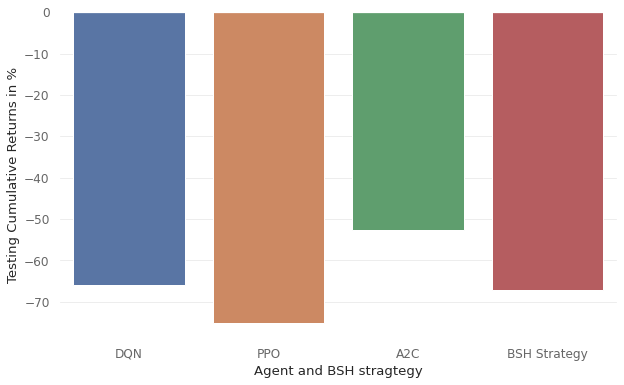

<Figure size 720x432 with 0 Axes>

In [26]:
BSH_test = pd.DataFrame([['BSH Strategy',-67.2]], columns=['agents','returns'])

compare_BSH_test = pd.concat([test_K_networth_records, BSH_test])

#plot the change in return for all repeat_agent_trainings
# fig = plt.figure()
# ax = fig.add_axes([0,0,1,1])
# ax.bar(compare_BSH_test['agents'],compare_BSH_test['returns'])
# plt.axhline(y=0)
# plt.ylabel('Testing Cumulative Returns in %')
# plt.xlabel('Agent and BSH stragtegy')
# plt.show()


import seaborn as sns

plt.ylabel('Testing Cumulative Returns in %')
test = sns.barplot(y='returns',x='agents',data=compare_BSH_test)

test.set(xlabel='Agent and BSH stragtegy', ylabel='Testing Cumulative Returns in %')

plt.show()

plt.savefig('base_test_results')

**Evaluating Agent performances**

In [27]:
import quantstats as qs
qs.extend_pandas()


def metrics(env,data):
  performance = pd.DataFrame.from_dict(env.action_scheme.portfolio.performance, orient='index')
  net_worth = performance['net_worth'].iloc[:]

  returns = net_worth.pct_change().iloc[1:]


  returns.index = pd.date_range(start=test_data['date'].iloc[0], freq='1D', periods=returns.size)

  qs.reports.metrics(returns, mode='full')

name_agents = ['DQN','PPO','A2C']

for env,names in zip([test_DQN, test_PPO, test_A2C],name_agents):

  print(names, 'Agent')
  metrics(env,test_data)
  print('============================================')

DQN Agent
                           Strategy
-------------------------  ----------
Start Period               2021-11-12
End Period                 2022-07-15
Risk-Free Rate             0.0%
Time in Market             100.0%

Cumulative Return          -65.98%
CAGR﹪                     -79.94%

Sharpe                     -1.66
Prob. Sharpe Ratio         4.95%
Smart Sharpe               -1.61
Sortino                    -2.1
Smart Sortino              -2.05
Sortino/√2                 -1.49
Smart Sortino/√2           -1.45
Omega                      0.75

Max Drawdown               -70.49%
Longest DD Days            243
Volatility (ann.)          56.75%
Calmar                     -1.13
Skew                       -0.24
Kurtosis                   2.65

Expected Daily %           -0.44%
Expected Monthly %         -11.29%
Expected Yearly %          -41.67%
Kelly Criterion            -16.3%
Risk of Ruin               0.0%
Daily Value-at-Risk        -6.25%
Expected Shortfall (cVaR)  -6.25%

Ma

In [28]:
# #To save indivual value
# qs.stats.shapre(returns)
#[f for f in dir(qs.stats) if f[0] != '_']
#[f for f in dir(qs.plots) if f[0] != '_']

**Plots for DQN**

[Performance Metrics]

                           Strategy
-------------------------  ----------
Start Period               2021-11-12
End Period                 2022-07-15
Risk-Free Rate             0.0%
Time in Market             100.0%

Cumulative Return          -65.98%
CAGR﹪                     -79.94%

Sharpe                     -1.66
Prob. Sharpe Ratio         4.95%
Smart Sharpe               -1.61
Sortino                    -2.1
Smart Sortino              -2.05
Sortino/√2                 -1.49
Smart Sortino/√2           -1.45
Omega                      0.75

Max Drawdown               -70.49%
Longest DD Days            243
Volatility (ann.)          56.75%
Calmar                     -1.13
Skew                       -0.24
Kurtosis                   2.65

Expected Daily %           -0.44%
Expected Monthly %         -11.29%
Expected Yearly %          -41.67%
Kelly Criterion            -16.3%
Risk of Ruin               0.0%
Daily Value-at-Risk        -6.25%
Expected Shortfall (cVaR

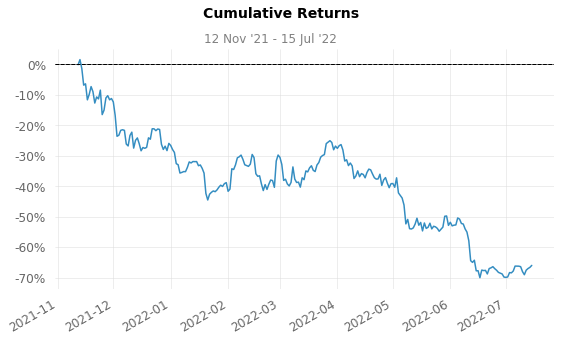

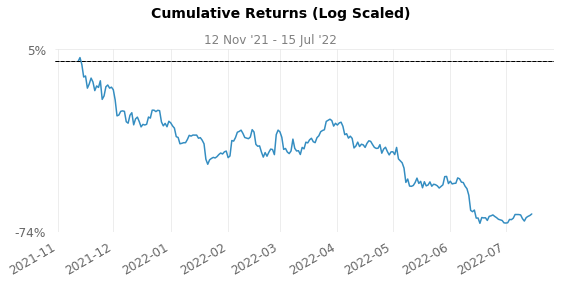

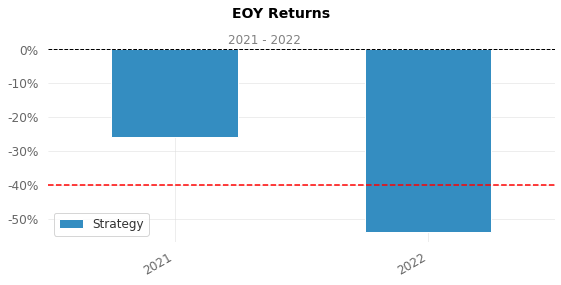

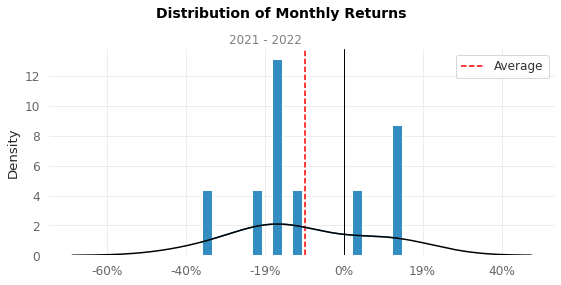

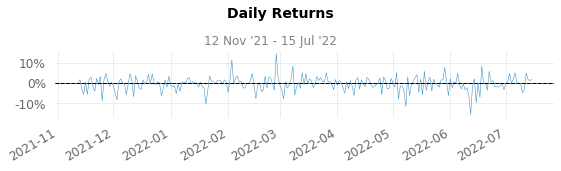

...

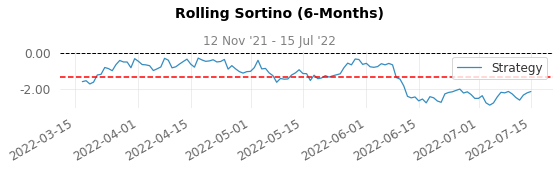

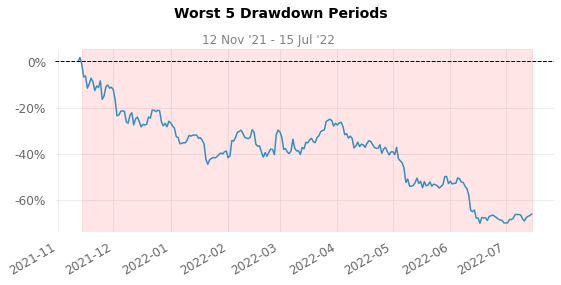

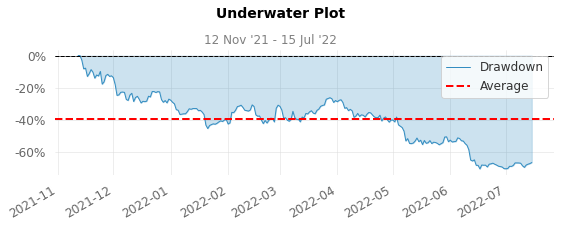

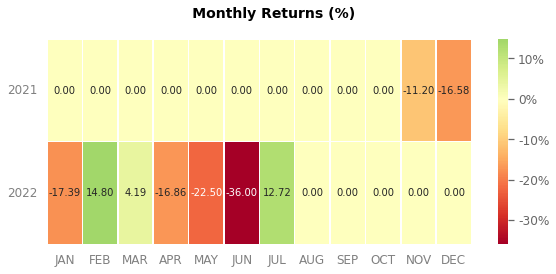

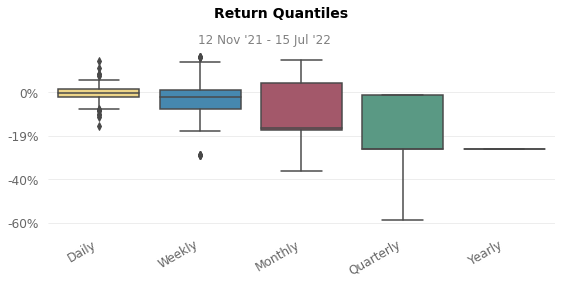

In [29]:

#Select from these environments:
test_DQN
test_PPO
test_A2C



print_quantstats_full_report(test_DQN, test_data)

**Plots for PPO**

[Performance Metrics]

                           Strategy
-------------------------  ----------
Start Period               2021-11-12
End Period                 2022-06-21
Risk-Free Rate             0.0%
Time in Market             71.0%

Cumulative Return          -75.06%
CAGR﹪                     -89.91%

Sharpe                     -3.47
Prob. Sharpe Ratio         0.01%
Smart Sharpe               -3.01
Sortino                    -3.88
Smart Sortino              -3.36
Sortino/√2                 -2.74
Smart Sortino/√2           -2.38
Omega                      0.43

Max Drawdown               -75.06%
Longest DD Days            218
Volatility (ann.)          42.56%
Calmar                     -1.2
Skew                       -1.43
Kurtosis                   8.45

Expected Daily %           -0.62%
Expected Monthly %         -15.93%
Expected Yearly %          -50.06%
Kelly Criterion            -39.6%
Risk of Ruin               0.0%
Daily Value-at-Risk        -5.0%
Expected Shortfall (cVaR) 

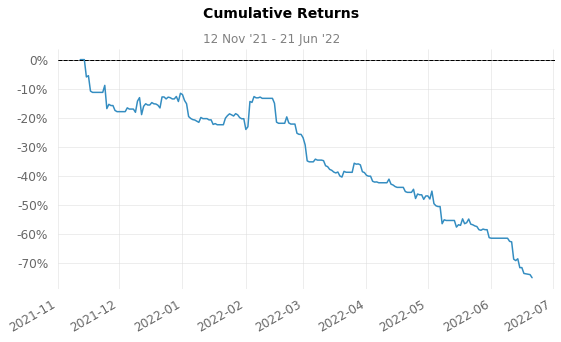

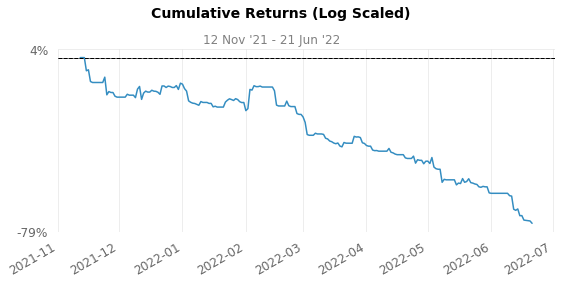

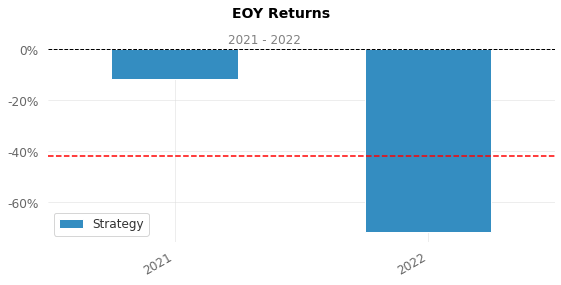

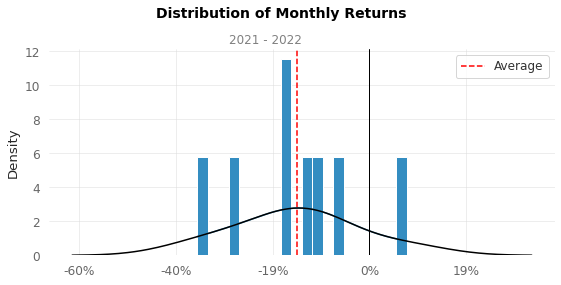

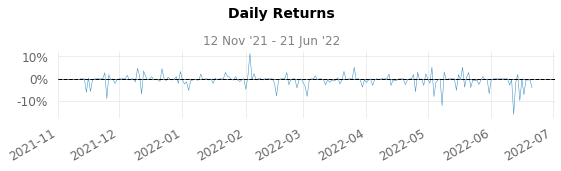

...

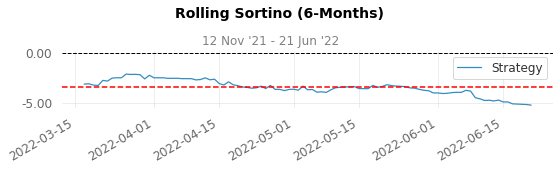

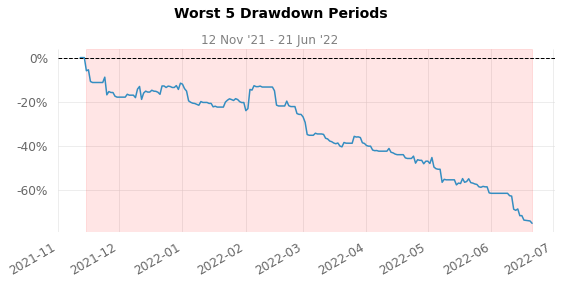

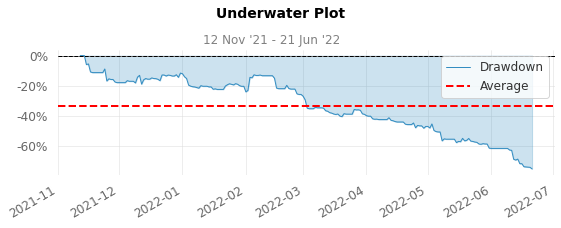

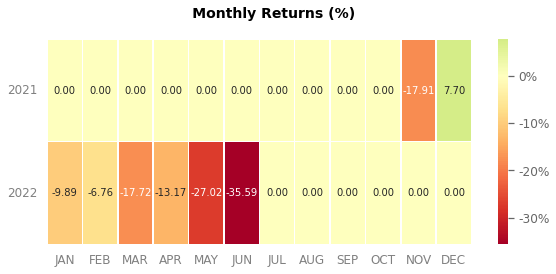

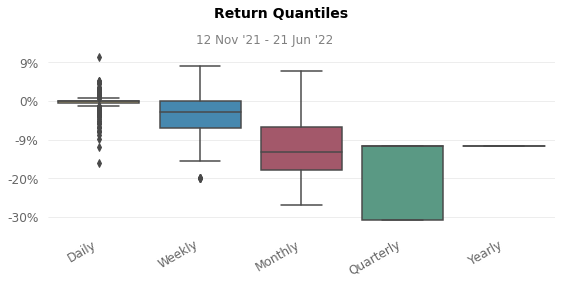

In [30]:
print_quantstats_full_report(test_PPO, test_data)

**Plots for A2C**

[Performance Metrics]

                           Strategy
-------------------------  ----------
Start Period               2021-11-12
End Period                 2022-07-15
Risk-Free Rate             0.0%
Time in Market             46.0%

Cumulative Return          -52.61%
CAGR﹪                     -67.12%

Sharpe                     -2.38
Prob. Sharpe Ratio         0.59%
Smart Sharpe               -2.24
Sortino                    -2.83
Smart Sortino              -2.66
Sortino/√2                 -2.0
Smart Sortino/√2           -1.88
Omega                      0.51

Max Drawdown               -55.55%
Longest DD Days            243
Volatility (ann.)          30.13%
Calmar                     -1.21
Skew                       -1.13
Kurtosis                   8.44

Expected Daily %           -0.3%
Expected Monthly %         -7.96%
Expected Yearly %          -31.16%
Kelly Criterion            -26.98%
Risk of Ruin               0.0%
Daily Value-at-Risk        -3.41%
Expected Shortfall (cVaR) 

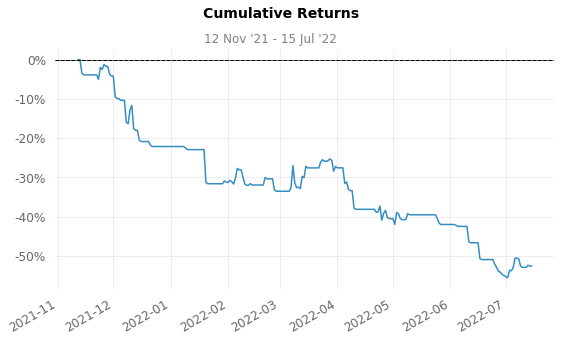

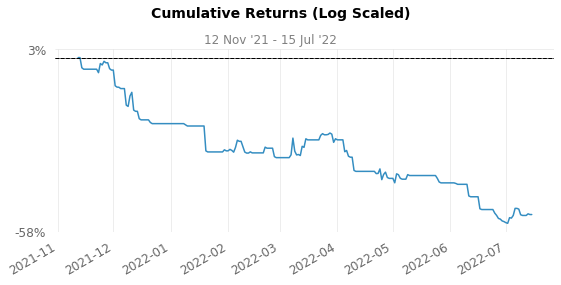

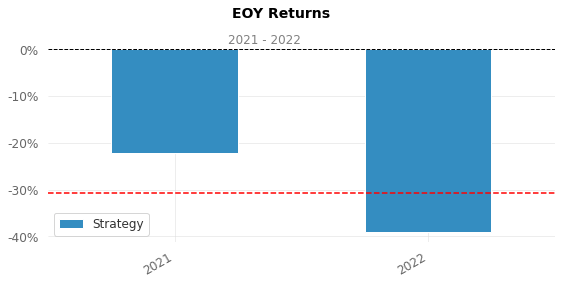

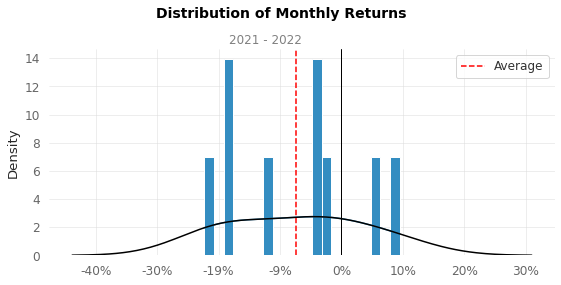

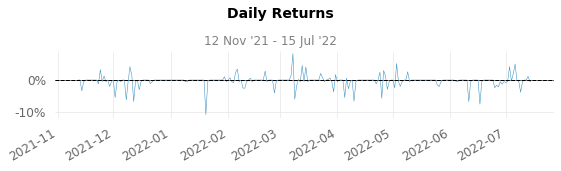

...

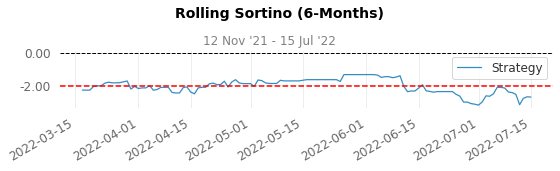

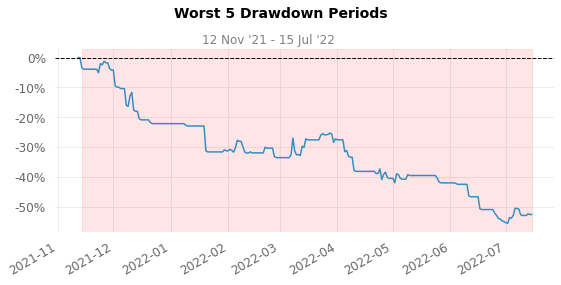

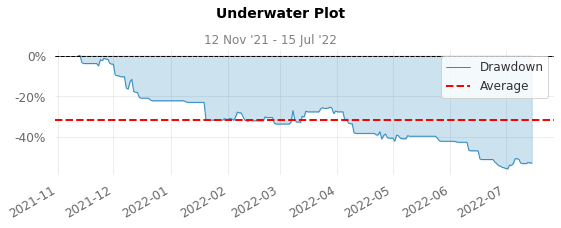

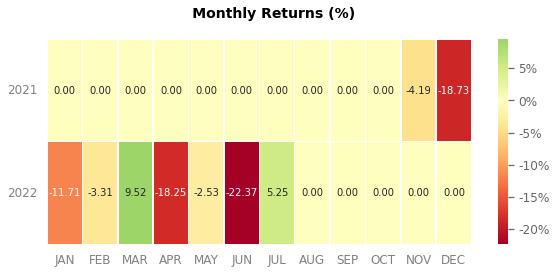

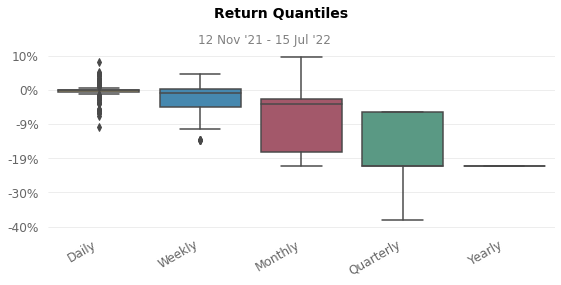

In [31]:
print_quantstats_full_report(test_A2C, test_data)